# Static Visualizations for Checkpoint 1

## Importing data, packages

In [102]:
# importing packages
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [16]:
# load data
df = pd.read_csv('emergency_service_routing_with_timestamps.csv')
df.head(3)

# convert timestamp to pd.Datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'])
df['Hour'] = df['Timestamp'].dt.hour
df

,Timestamp,Incident_Severity,Incident_Type,Region_Type,Traffic_Congestion,Weather_Condition,Drone_Availability,Ambulance_Availability,Battery_Life,Air_Traffic,...,Road_Type,Emergency_Level,Drone_Speed,Ambulance_Speed,Payload_Weight,Fuel_Level,Weather_Impact,Dispatch_Coordinator,Label,Hour
0,2018-01-01 00:00:00,Low,Cardiac Arrest,Suburban,High,Clear,Available,Available,71.177951,Low,...,Highway,Major,59.578538,43.549849,9.28,90.030756,Severe,AI,Ambulance Only,0
1,2018-01-01 00:10:00,Low,Other,Urban,Moderate,Clear,Available,Available,70.949595,Low,...,Highway,Critical,74.578440,30.687975,9.47,88.255008,Moderate,Human,Ambulance Only,0
2,2018-01-01 00:20:00,Medium,Cardiac Arrest,Suburban,High,Rainy,Unavailable,Available,74.346037,Medium,...,Unpaved Road,Minor,45.900425,44.456331,8.77,97.719622,NaN,Human,Hybrid Dispatch,0
3,2018-01-01 00:30:00,Low,Accident,Urban,Moderate,Clear,Available,Available,84.199630,Medium,...,Highway,Minor,50.927769,35.879968,4.76,60.234672,NaN,Human,Ambulance Only,0
4,2018-01-01 00:40:00,Low,Cardiac Arrest,Urban,Moderate,Stormy,Available,Available,78.492584,Low,...,Highway,Minor,71.312741,26.369383,3.83,71.083564,Moderate,Human,Ambulance Only,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368060,2024-12-30 23:20:00,Medium,Cardiac Arrest,Rural,Low,Clear,Unavailable,Available,66.558795,Low,...,Highway,Minor,56.286365,52.560965,1.58,52.118376,Moderate,Human,Ambulance Only,23
368061,2024-12-30 23:30:00,High,Accident,Suburban,Low,Clear,Available,Available,81.461693,Medium,...,Highway,Minor,49.053666,42.738073,6.72,71.485832,Moderate,Human,Drone Only,23
368062,2024-12-30 23:40:00,Low,Fire,Urban,Moderate,Rainy,Available,Unavailable,96.306965,High,...,Unpaved Road,Minor,68.594500,43.578888,9.69,51.960692,Moderate,Human,Ambulance Only,23
368063,2024-12-30 23:50:00,Medium,Accident,Urban,Moderate,Clear,Unavailable,Available,76.803061,Medium,...,Highway,Major,53.641935,30.379377,0.62,87.275648,NaN,Human,Hybrid Dispatch,23


# VIS 1: response time histogram, colorcoded by emergency_level
(grace)
emergency levels make a big impact on response time, just as we would theorize. It makes sense that Major incidents had the fastest response time, followed by critical, then by minor

In [17]:
px.histogram(
    df, 
    x='Distance_to_Incident', 
    y='Response_Time', 
    color='Emergency_Level', 
    histfunc='avg',
    opacity=0.6)

# VIS 2 : Heatmap of Avg Response Time by Traffic and Weather

In [18]:
heat_df = df.pivot_table(
    values = 'Response_Time',
    index = 'Traffic_Congestion',
    columns = 'Weather_Condition',
    aggfunc = 'mean'
)

heat_df.head()

Weather_Condition,Clear,Rainy,Stormy
Traffic_Congestion,,,
High,15.046318,15.048178,15.248625
Low,15.043470,15.093738,15.146821
Moderate,15.052908,15.093367,15.044955


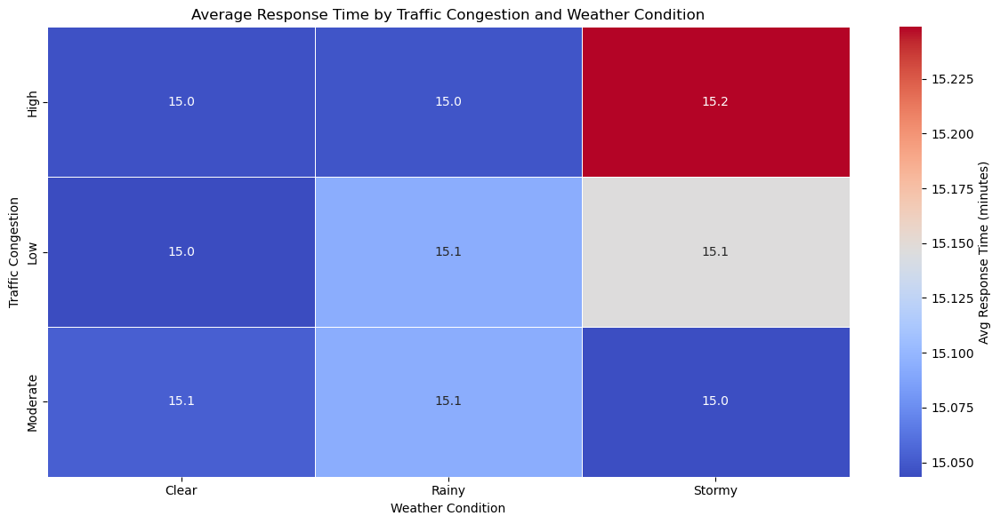

In [19]:
plt.figure(figsize=(12, 6))

ax = sns.heatmap(
    heat_df,
    annot = True,
    fmt = ".1f",
    cmap = 'coolwarm',
    linewidths = 0.5,
    cbar_kws = {'label': 'Avg Response Time (minutes)'}
)

plt.title('Average Response Time by Traffic Congestion and Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Traffic Congestion')
plt.tight_layout()
plt.show()

In [20]:
hourly_avg = df.groupby('Hour')['Response_Time'].mean().reset_index()
hourly_avg

,Hour,Response_Time
0,0,15.109096
1,1,15.119766
2,2,15.073793
3,3,15.064489
4,4,14.943212
5,5,15.050351
6,6,15.057304
7,7,15.034187
8,8,15.083836
9,9,15.076591


# VIS 3: Linechart of Average Response Time by Hour of Day

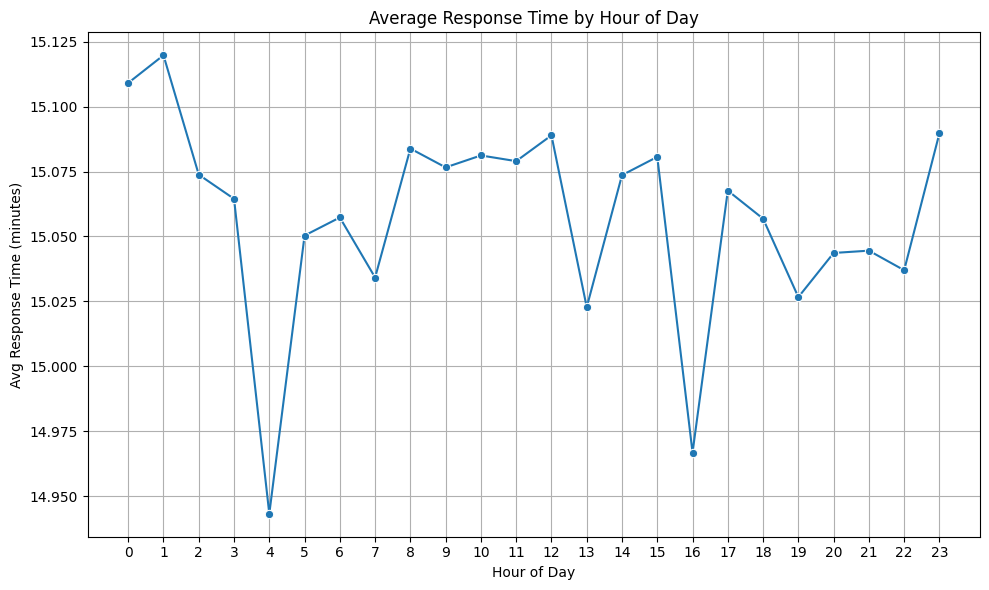

In [110]:
plt.figure(figsize = (10, 6))
sns.lineplot(data = hourly_avg, x = 'Hour', y = 'Response_Time', marker = 'o')
plt.title('Average Response Time by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Avg Response Time (minutes)')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()
plt.show()

In [111]:
df.columns

Index(['Timestamp', 'Incident_Severity', 'Incident_Type', 'Region_Type',
       'Traffic_Congestion', 'Weather_Condition', 'Drone_Availability',
       'Ambulance_Availability', 'Battery_Life', 'Air_Traffic',
       'Response_Time', 'Hospital_Capacity', 'Distance_to_Incident',
       'Number_of_Injuries', 'Specialist_Availability', 'Road_Type',
       'Emergency_Level', 'Drone_Speed', 'Ambulance_Speed', 'Payload_Weight',
       'Fuel_Level', 'Weather_Impact', 'Dispatch_Coordinator', 'Label',
       'Hour'],
      dtype='object')

## VIS 4: Response Time vs Number of Injuries & Emergency Level

Text(0, 0.5, 'Response Time (Minutes)')

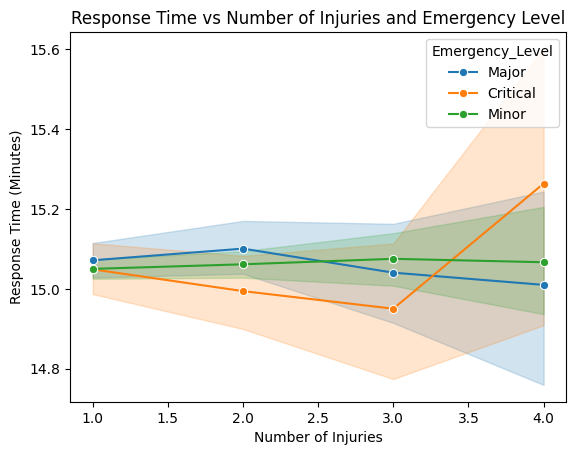

In [ ]:
fig = sns.lineplot(df, 
             x = 'Number_of_Injuries', 
             y = 'Response_Time', 
             hue = 'Emergency_Level',
             marker = 'o',
             )
plt.title('Response Time vs Number of Injuries and Emergency Level')
plt.xlabel('Number of Injuries')
plt.ylabel('Response Time (Minutes)')


In [113]:
df_numeric = df.select_dtypes(include=['number'])
df_numeric # Finding numeric columns

,Battery_Life,Response_Time,Hospital_Capacity,Distance_to_Incident,Number_of_Injuries,Drone_Speed,Ambulance_Speed,Payload_Weight,Fuel_Level,Hour
0,71.177951,20.870220,91,8.89,1,59.578538,43.549849,9.28,90.030756,0
1,70.949595,24.486195,28,28.10,2,74.578440,30.687975,9.47,88.255008,0
2,74.346037,18.760740,83,40.43,1,45.900425,44.456331,8.77,97.719622,0
3,84.199630,18.169534,31,18.97,3,50.927769,35.879968,4.76,60.234672,0
4,78.492584,5.000000,52,16.31,3,71.312741,26.369383,3.83,71.083564,0
...,...,...,...,...,...,...,...,...,...,...
368060,66.558795,12.465708,85,24.11,3,56.286365,52.560965,1.58,52.118376,23
368061,81.461693,11.006577,45,43.26,1,49.053666,42.738073,6.72,71.485832,23
368062,96.306965,16.782428,97,42.13,1,68.594500,43.578888,9.69,51.960692,23
368063,76.803061,14.063774,37,39.57,2,53.641935,30.379377,0.62,87.275648,23


In [114]:
incident_time_avg = df.groupby('Hospital_Capacity')['Response_Time'].mean().reset_index()
incident_time_avg

,Hospital_Capacity,Response_Time
0,10,15.014615
1,11,15.006589
2,12,15.069405
3,13,15.021357
4,14,15.056342
...,...,...
85,95,15.053173
86,96,15.036737
87,97,15.077092
88,98,15.130916


## VIS 5: Response Time vs Hospital Capacity

In [116]:
fig = px.line(incident_time_avg,
                 x = 'Hospital_Capacity',
                 y = 'Response_Time',
                 markers=True,
                 title='Response Time vs Hospital Capacity',
                 labels={'Hospital_Capacity': 'Hospital Capacity', 'Response_Time': 'Response Time (Minutes)'},)

fig.show()
